In [1]:
%matplotlib inline
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import scipy.stats as stats
import sklearn.linear_model as linear_model
import seaborn as sns
import xgboost as xgb
import scipy.stats as st
from sklearn.model_selection import KFold
from IPython.display import HTML, display
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os

import math
from plotly import tools
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.go_offline()
init_notebook_mode(connected=True)

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import  MinMaxScaler

pd.options.display.max_rows = 1000
pd.options.display.max_columns = 20


/home/luiz/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

Using TensorFlow backend.


In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

quantitative = [f for f in train.columns if train.dtypes[f] != 'object']
quantitative.remove('SalePrice')
quantitative.remove('Id')
qualitative = [f for f in train.columns if train.dtypes[f] == 'object']

In [3]:
missing = train.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.iplot(kind='bar',title="Valores sem preenchimento",colorscale='RdBu')

In [4]:
test_normality = lambda x: stats.shapiro(x.fillna(0))[1] < 0.01
normal = pd.DataFrame(train[quantitative])
normal = normal.apply(test_normality)
print(not normal.any())

False


/home/luiz/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



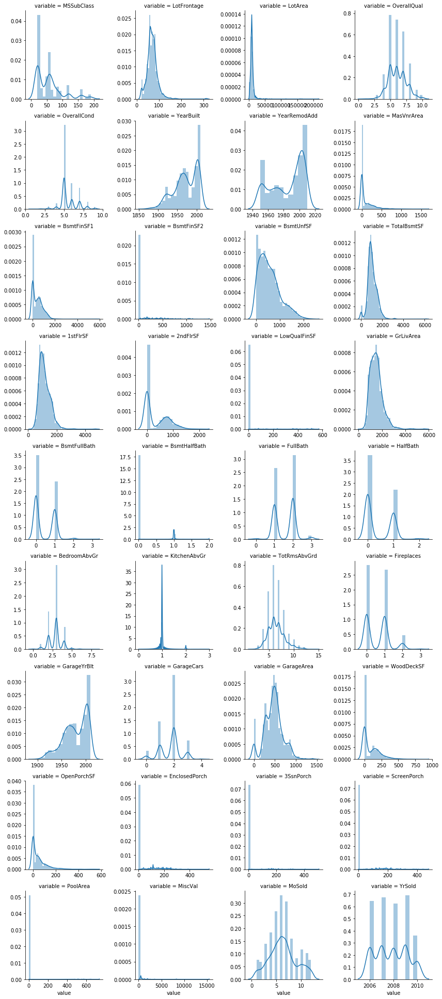

In [5]:
f = pd.melt(train, value_vars=quantitative)
g = sns.FacetGrid(f, col="variable",  col_wrap=4, sharex=False, sharey=False)
g = g.map(sns.distplot, "value")

# # Add histogram data
# x1 = np.random.randn(200)-2  
# x2 = np.random.randn(200)  
# x3 = np.random.randn(200)+2  
# x4 = np.random.randn(200)+4  

# # Group data together
# hist_data = [x1, x2, x3, x4]

# group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']

# # Create distplot with custom bin_size
# fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# # Plot!
# py.iplot(fig, filename='Distplot with Multiple Datasets')

# fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

In [6]:
def plot_hists(f):
    hist_datas=[]
    group_labels = []
    bin_sizes = []

    # print(f[f['variable'] ==  f['variable'][0]]['value'])
    x=0
    for variable in f['variable'].unique():    
            c=(f[f['variable'] ==  variable]['value'].fillna(0))   
            hist_datas.append(c)
            group_labels.append(variable)
            ranging = max(c)-min(c)
            size = ranging/10
            bin_sizes.append(size)

    figs = []
    for i in range(len(hist_datas)):
        hist_data = [hist_datas[i]]
        group_label = [group_labels[i]]
        bin_size = [bin_sizes[i]]
        fig = ff.create_distplot(hist_data, group_label, bin_size=bin_size)
        fig['layout'].update(title=group_label[0])
        figs.append(fig)
    for fig in figs:
        iplot(fig, filename='Distplot with Multiple Datasets')
        
f = pd.melt(train, value_vars=quantitative)
plot_hists(f)

In [7]:
for c in qualitative:
    train[c] = train[c].astype('category')
    if train[c].isnull().any():
        train[c] = train[c].cat.add_categories(['MISSING'])
        train[c] = train[c].fillna('MISSING')
def gen_box(dataset,features,y_var):
    dados =[]
    figs=[]
    f = pd.melt(dataset, id_vars=[y_var], value_vars=features)
    titles=[f for f in features]
    for feature in features:
        df_variable=f[f['variable'] == feature]
        values = df_variable['value'].unique()  
        dado=[]
        layout = {'title':feature}
        for value in values:
            dado.append(go.Box(y=df_variable[df_variable['value'] == value]['SalePrice'], name=value, showlegend=False))
        figs.append(go.Figure(data=dado,layout=layout))
    for fig in figs:
        iplot(fig)
        
gen_box(train,qualitative,'SalePrice')

In [8]:
def anova(frame):
    anv = pd.DataFrame()
    anv['feature'] = qualitative
    pvals = []
    for c in qualitative:
        samples = []
        for cls in frame[c].unique():
            s = frame[frame[c] == cls]['SalePrice'].values
            samples.append(s)
        pval = stats.f_oneway(*samples)[1]
        pvals.append(pval)
    anv['pval'] = pvals
    return anv.sort_values('pval')
a = anova(train)
a['disparity'] = np.log(1./a['pval'].values)
def plot_anova(a):
    data = [
        go.Bar(
            x=a['feature'], # assign x as the dataframe column 'x'
            y=a['disparity'],
            name='disparity',
            marker={'color': a['disparity'],
                    'colorscale': 'Rainbow'}

        ),
        go.Bar(
            x=a['feature'],
            y=a['pval'],
            name='pval',
            marker={'color': a['pval'],
                    'colorscale': 'Rainbow'}


        )
    ]
    layout = go.Layout(    
        title='Anova disparity'
    )
    iplot(data)
plot_anova(a)

In [9]:
def encode(frame, feature):
    ordering = pd.DataFrame()
    ordering['val'] = frame[feature].unique()
    ordering.index = ordering.val
    ordering['spmean'] = frame[[feature, 'SalePrice']].groupby(feature).mean()['SalePrice']
    ordering = ordering.sort_values('spmean')
    ordering['ordering'] = range(1, ordering.shape[0]+1)
    ordering = ordering['ordering'].to_dict()
    
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature+'_E'] = o
    
qual_encoded = []
for q in qualitative:  
    encode(train, q)
    qual_encoded.append(q+'_E')
print(qual_encoded)

['MSZoning_E', 'Street_E', 'Alley_E', 'LotShape_E', 'LandContour_E', 'Utilities_E', 'LotConfig_E', 'LandSlope_E', 'Neighborhood_E', 'Condition1_E', 'Condition2_E', 'BldgType_E', 'HouseStyle_E', 'RoofStyle_E', 'RoofMatl_E', 'Exterior1st_E', 'Exterior2nd_E', 'MasVnrType_E', 'ExterQual_E', 'ExterCond_E', 'Foundation_E', 'BsmtQual_E', 'BsmtCond_E', 'BsmtExposure_E', 'BsmtFinType1_E', 'BsmtFinType2_E', 'Heating_E', 'HeatingQC_E', 'CentralAir_E', 'Electrical_E', 'KitchenQual_E', 'Functional_E', 'FireplaceQu_E', 'GarageType_E', 'GarageFinish_E', 'GarageQual_E', 'GarageCond_E', 'PavedDrive_E', 'PoolQC_E', 'Fence_E', 'MiscFeature_E', 'SaleType_E', 'SaleCondition_E']


In [10]:
def spearman(frame, features):
    spr = pd.DataFrame()
    spr['feature'] = features
    spr['spearman'] = [frame[f].corr(frame['SalePrice'], 'spearman') for f in features]
    spr = spr.sort_values('spearman',ascending=False)
    return spr
def plot_spearman(spr):
    data = [
    go.Bar(
        x=spr['spearman'], # assign x as the dataframe column 'x'
        y=spr['feature'],
        name='disparity',
        orientation = 'h',
        marker={'color': spr['spearman'],
                'colorscale': 'Rainbow'}
        ),
       
    ]
    layout = go.Layout(    
        title='Anova disparity',
        height=12*len(features),
        
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
#     sns.barplot(data=spr, y='feature', x='spearman', orient='h')
    
features = quantitative + qual_encoded
spr=spearman(train, features)
plot_spearman(spr)

In [11]:
# plt.figure(1)
corr = train[quantitative+['SalePrice']].corr()
# sns.heatmap(corr)
corr.iplot(kind='heatmap',colorscale='RdBu')
# plt.figure(2)
corr = train[qual_encoded+['SalePrice']].corr()
corr.iplot(kind='heatmap',colorscale='RdBu')
# sns.heatmap(corr)
# plt.figure(3)
corr = pd.DataFrame(np.zeros([len(quantitative)+1, len(qual_encoded)+1]), index=quantitative+['SalePrice'], columns=qual_encoded+['SalePrice'])
for q1 in quantitative+['SalePrice']:
    for q2 in qual_encoded+['SalePrice']:
        corr.loc[q1, q2] = train[q1].corr(train[q2])
corr.iplot(kind='heatmap',colorscale='RdBu')
# sns.heatmap(corr)

/home/luiz/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:29: RuntimeWarning:

invalid value encountered in reduce

/home/luiz/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:26: RuntimeWarning:

invalid value encountered in reduce



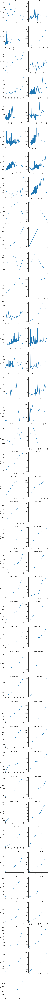

In [12]:
def pairplot(x, y, **kwargs):
    ax = plt.gca()
    ts = pd.DataFrame({'time': x, 'val': y})
    ts = ts.groupby('time').mean()
    ts.plot(ax=ax)
    plt.xticks(rotation=90)
    
# f = pd.melt(train, id_vars=['SalePrice'], value_vars=quantitative+qual_encoded)
f = pd.melt(train, id_vars=['SalePrice'], value_vars=quantitative+qual_encoded)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(pairplot, "value", "SalePrice")

In [13]:
def gen_pairs(dataset,features,y_var):
    dados =[]
    titles=[f for f in features]
    for feature in features:        
            x=dataset[feature].fillna(0.)
            y=dataset[y_var].fillna(0.)
            p=pd.DataFrame({'x': x, 'y': y})
            p = p.groupby('x').mean()
            dados.append(go.Scatter(
            x=p.index,
            y=p['y'],
            name=feature
            ))            
    return dados,titles

def grid_plot(dados,titles,max_cols):
    max_rows=math.ceil(len(dados)/max_cols)
    fig = tools.make_subplots(rows=max_rows, cols=max_cols,subplot_titles = titles,print_grid=False)
    linha = 1
    coluna = 1
    for dado in dados:
        fig.append_trace(dado, linha, coluna)
        if coluna < max_cols:
            coluna +=1
        else:
            coluna = 1
            linha += 1
    fig['layout'].update(height=350*max_rows, width=800, title='Pair Plots',showlegend=False)
    iplot(fig)
dados,titles = gen_pairs(train,quantitative+qual_encoded,'SalePrice')
grid_plot(dados,titles,2)

In [14]:
def plot_diffs(features,thres): 
    standard = train[train['SalePrice'] < thres]
    pricey = train[train['SalePrice'] >= thres]

    diff = pd.DataFrame()
    diff['feature'] = features

    diff['difference'] = [(pricey[f].fillna(0.).mean() - standard[f].fillna(0.).mean())/(standard[f].fillna(0.).mean())
                      for f in features]
#     print(diff)
#     diff['difference'] = diffs
#     print(diff)
    diff.sort_values(inplace=True,by='difference')
    diff.index=diff['feature']
    diff=diff.drop(columns=['feature'])
    data = [
    go.Bar(
        x=diff.index, # assign x as the dataframe column 'x'
        y=diff['difference'],
        name='Diferencas',       
        marker={'color': diff['difference'],
                'colorscale': 'Rainbow'}
        ),
       
    ]
    layout = go.Layout(    
        title='Diferenca entre baratas e caras',
        height=12*len(diff),        
        
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
features = quantitative
plot_diffs(features,train['SalePrice'].mean())

In [15]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

def f(x):
    plot_diffs(features,x)
interact(f, x=200000);

interactive(children=(IntSlider(value=200000, description='x', max=600000, min=-200000), Output()), _dom_classes=('widget-interact',))

0.7495371745053999


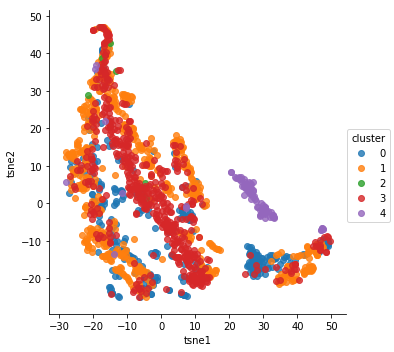

In [16]:
features = quantitative + qual_encoded
model = TSNE(n_components=2, random_state=0, perplexity=50)
X = train[features].fillna(0.).values
tsne = model.fit_transform(X)

std = StandardScaler()
s = std.fit_transform(X)
pca = PCA(n_components=30)
pca.fit(s)
pc = pca.transform(s)
kmeans = KMeans(n_clusters=5)
kmeans.fit(pc)

fr = pd.DataFrame({'tsne1': tsne[:,0], 'tsne2': tsne[:, 1], 'cluster': kmeans.labels_})
sns.lmplot(data=fr, x='tsne1', y='tsne2', hue='cluster', fit_reg=False)
print(np.sum(pca.explained_variance_ratio_))

In [19]:
y = train['SalePrice'].values
def johnson(y):
    gamma, eta, epsilon, lbda = stats.johnsonsu.fit(y)
    yt = gamma + eta*np.arcsinh((y-epsilon)/lbda)
    return yt, gamma, eta, epsilon, lbda

def johnson_inverse(y, gamma, eta, epsilon, lbda):
    return lbda*np.sinh((y-gamma)/eta) + epsilon

def plot_hist_single(y,name,bins):
    hist_data=[y]
    group_label=[name]
    bin_size=[(max(y)-min(y))/bins]
    fig = ff.create_distplot(hist_data, group_label, bin_size=bin_size)
    iplot(fig, filename='Distplot with Multiple Datasets')
    


yt, g, et, ep, l = johnson(y)
yt2 = johnson_inverse(yt, g, et, ep, l)    
plot_hist_single(yt,'johnson',20)
plot_hist_single(yt2,'johnson',20)


In [20]:
def error(actual, predicted):
    actual = np.log(actual)
    predicted = np.log(predicted)
    return np.sqrt(np.sum(np.square(actual-predicted))/len(actual))

def log_transform(feature):
    train[feature] = np.log1p(train[feature].values)

def quadratic(feature):
    train[feature+'2'] = train[feature]**2
    
log_transform('GrLivArea')
log_transform('1stFlrSF')
log_transform('2ndFlrSF')
log_transform('TotalBsmtSF')
log_transform('LotArea')
log_transform('LotFrontage')
log_transform('KitchenAbvGr')
log_transform('GarageArea')

quadratic('OverallQual')
quadratic('YearBuilt')
quadratic('YearRemodAdd')
quadratic('TotalBsmtSF')
quadratic('2ndFlrSF')
quadratic('Neighborhood_E')
quadratic('RoofMatl_E')
quadratic('GrLivArea')

qdr = ['OverallQual2', 'YearBuilt2', 'YearRemodAdd2', 'TotalBsmtSF2',
        '2ndFlrSF2', 'Neighborhood_E2', 'RoofMatl_E2', 'GrLivArea2']

train['HasBasement'] = train['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
train['HasGarage'] = train['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
train['Has2ndFloor'] = train['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
train['HasMasVnr'] = train['MasVnrArea'].apply(lambda x: 1 if x > 0 else 0)
train['HasWoodDeck'] = train['WoodDeckSF'].apply(lambda x: 1 if x > 0 else 0)
train['HasPorch'] = train['OpenPorchSF'].apply(lambda x: 1 if x > 0 else 0)
train['HasPool'] = train['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
train['IsNew'] = train['YearBuilt'].apply(lambda x: 1 if x > 2000 else 0)

boolean = ['HasBasement', 'HasGarage', 'Has2ndFloor', 'HasMasVnr', 'HasWoodDeck',
            'HasPorch', 'HasPool', 'IsNew']


features = quantitative + qual_encoded + boolean + qdr
lasso = linear_model.LassoLarsCV(max_iter=10000)
X = train[features].fillna(0.).values
Y = train['SalePrice'].values
lasso.fit(X, np.log(Y))

Y_pred_lasso = np.exp(lasso.predict(X))
error(Y, Y_pred_lasso)

0.1126326901784307

In [32]:
transform = "linear"
cross_validation= True

X=train[quantitative + qual_encoded + boolean + qdr].fillna(0.).values
Y=train['SalePrice'].values

sc= MinMaxScaler()
X_mlp= sc.fit_transform(X)
# Y_mlp= Y.copy()


if transform == "linear":  
    Y_mlp=Y.reshape(-1,1)
    Y_mlp=sc.fit_transform(Y_mlp)
elif transform == "log":
    Y_mlp=np.log(Y)
    
def inverse(Y_in,transform):
    if transform == 'linear':
        return sc.inverse_transform(Y_in)
    elif transform == "log":
        return np.exp(Y_in)

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_mlp, Y_mlp, test_size=0.2)

/home/luiz/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by MinMaxScaler.



In [33]:
seed = 7
np.random.seed(seed)
def baseline_model():
	# create model

    model = Sequential()
    model.add(Dense(95, input_dim=95, kernel_initializer='normal', activation='relu'))
    model.add(Dense(1, kernel_initializer='normal'))
	# Compile model
#    model.compile(optimizer='adam', loss='mean_squared_error',  metrics=['mae','accuracy'])
    model.compile(loss='mean_squared_error', optimizer='adam',metrics=['accuracy'])
    return model


if cross_validation == False:    
    estimators = []
    estimators.append(('mlp', KerasRegressor(build_fn=baseline_model, epochs=200, batch_size=100, verbose=1)))
    pipeline_escolhido = Pipeline(estimators)
    results = pipeline_escolhido.fit(X_train, Y_train)
if cross_validation == True:
    from sklearn.model_selection import StratifiedKFold
   
    pipelines=[]
    errors = []
    models =[]
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
    for treino, test in kfold.split(X_mlp, Y):         
        model = baseline_model()
        print("training")
        model.fit(X_mlp[treino], Y_mlp[treino],epochs=100, batch_size=100, verbose=0)
        print("testing")
        Y_pred_test= model.predict(X_mlp[test]).reshape(-1,1)
        Y_pred_test_t = inverse(Y_pred_test,transform)
        Y_mlp_t = inverse(Y_mlp[test],transform)        
        errors.append(error(Y_pred_test_t,Y_mlp_t))  
        models.append(model)
# #         scores = model.evaluate(X[test], Y_mlp[test], verbose=1)
#         print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
#         cvscores.append(scores[1] * 100)
    idx_melhor = errors.index(min(errors))
    pipeline_escolhido=models[idx_melhor]
    print("melhor modelo:"+str(idx_melhor))
    print("erro do modelo:"+str(min(errors)))

   

/home/luiz/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning:

The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.



training
testing
training
testing
training
testing
training
testing
training
testing
training
testing
training
testing
training
testing
training
testing
training
testing
melhor modelo:5
erro do modelo:0.0844986854058413


In [34]:


Y_pred_test= pipeline_escolhido.predict(X_test).reshape(-1,1)
Y_pred_train= pipeline_escolhido.predict(X_train).reshape(-1,1)
Y_pred= pipeline_escolhido.predict(X_mlp).reshape(-1,1)

Y_test_t = inverse(Y_test,transform)
Y_train_t = inverse(Y_train,transform)
Y_mlp_t = inverse(Y_mlp,transform)
Y_pred_test_t = inverse(Y_pred_test,transform)
Y_pred_train_t = inverse(Y_pred_train,transform)
Y_pred_t = inverse(Y_pred,transform)  
    




In [35]:
if transform == "linear":
    print(error(Y_pred_test_t,Y_test_t))
    print(error(Y_pred_train_t,Y_train_t))
    print(error(Y_pred_t,Y_mlp_t))

if transform == "log":
    print(np.log(error(Y_pred_test_t,Y_test_t)))
    print(np.log(error(Y_pred_train_t,Y_train_t)))
    print(np.log(error(Y_pred_t,Y_mlp_t)))

0.10117300261592792
0.09840569260502524
0.09896534525440857


In [36]:
import plotly.tools as tls
def plot_result(pred,real,title):
    fig, ax = plt.subplots()
    ax.scatter(real, pred)
    ax.plot([pred.min(), pred.max()], [pred.min(), real.max()], 'k--', lw=4)
    ax.set_xlabel('Measured')
    ax.set_ylabel('Predicted')
    ax.set_title = title
    

    plotly_fig = tls.mpl_to_plotly(fig)
    # plotly_fig['data'].append( dict(x=x, y=logx, type='scatter', mode='lines') )
    iplot(plotly_fig, filename='Test Validation PLOT')
plot_result(Y_pred_test_t,Y_test_t,"Y Previsto vs Y real no conjunto de test")
plot_result(Y_pred_train_t,Y_train_t,"Y Previsto vs Y real no conjunto de treinamento")
plot_result(Y_pred_t,Y_mlp_t,"Y Previsto vs Y real no conjunto total")
plot_result(Y_pred_lasso,Y,"Y Previsto vs Y real do lasso")

/home/luiz/anaconda3/lib/python3.6/site-packages/plotly/matplotlylib/renderer.py:522: UserWarning:

Looks like the annotation(s) you are trying 
to draw lies/lay outside the given figure size.

Therefore, the resulting Plotly figure may not be 
large enough to view the full text. To adjust 
the size of the figure, use the 'width' and 
'height' keys in the Layout object. Alternatively,
use the Margin object to adjust the figure's margins.



In [21]:
import patsy

Y, X = patsy.dmatrices(
    "SalePrice ~ \
        GarageCars + \
        np.log1p(BsmtFinSF1) + \
        ScreenPorch + \
        Condition1_E + \
        Condition2_E + \
        WoodDeckSF + \
        np.log1p(LotArea) + \
        Foundation_E + \
        MSZoning_E + \
        MasVnrType_E + \
        HouseStyle_E + \
        Fireplaces + \
        CentralAir_E + \
        BsmtFullBath + \
        EnclosedPorch + \
        PavedDrive_E + \
        ExterQual_E + \
        bs(OverallCond, df=7, degree=1) + \
        bs(MSSubClass, df=7, degree=1) + \
        bs(LotArea, df=2, degree=1) + \
        bs(FullBath, df=3, degree=1) + \
        bs(HalfBath, df=2, degree=1) + \
        bs(BsmtFullBath, df=3, degree=1) + \
        bs(TotRmsAbvGrd, df=2, degree=1) + \
        bs(LandSlope_E, df=2, degree=1) + \
        bs(LotConfig_E, df=2, degree=1) + \
        bs(SaleCondition_E, df=3, degree=1) + \
        OverallQual + np.square(OverallQual) + \
        GrLivArea + np.square(GrLivArea) + \
        Q('1stFlrSF') + np.square(Q('1stFlrSF')) + \
        Q('2ndFlrSF') + np.square(Q('2ndFlrSF')) +  \
        TotalBsmtSF + np.square(TotalBsmtSF) +  \
        KitchenAbvGr + np.square(KitchenAbvGr) +  \
        YearBuilt + np.square(YearBuilt) + \
        Neighborhood_E + np.square(Neighborhood_E) + \
        Neighborhood_E:OverallQual + \
        MSSubClass:BldgType_E + \
        ExterQual_E:OverallQual + \
        PoolArea:PoolQC_E + \
        Fireplaces:FireplaceQu_E + \
        OverallQual:KitchenQual_E + \
        GarageQual_E:GarageCond + \
        GarageArea:GarageCars + \
        Q('1stFlrSF'):TotalBsmtSF + \
        TotRmsAbvGrd:GrLivArea",
    train.to_dict('list'))

ridge = linear_model.RidgeCV(cv=10)
ridge.fit(X, np.log(Y))
Ypred = np.exp(ridge.predict(X))
print(error(Y,Ypred))

AssertionError: 